# IMPORTING RELEVANT LIBRARIES, LOADING MODEL

In [ ]:
import os

import rasterio
# import shapely.geometry
import geojson

from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM 

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import spec_defs

# from garuda.ops import obb_to_aa

import torch
import torchvision.transforms as transforms
if torch.cuda.is_available():
    device = torch.device("cuda:3")
else:
    device = torch.device("cpu")
    print("CUDA is not available, using CPU")

model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True, torch_dtype='auto').eval().to(device)
processor = AutoProcessor.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)

torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

ModuleNotFoundError: No module named 'garuda.ops'

# DEFINING FUNCTIONS

In [23]:
def zero_shot_bbox(image_path, label_path, task, text):
    # metadata_path = "/home/patel_zeel/kiln_compass_24/data/lucknow_airshed/metadata.geojson"
    # with open(metadata_path) as f:
    #     metadata = geojson.load(f) # loading metadata
    image_tensor,label_tensor, image_metadata = spec_defs.load_image_and_label(image_path, label_path, metadata=[]) # loading image and labels
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy() # creating np array of image
    height, width, _ = image_np.shape # finding height and width of image in pixels
    image = Image.fromarray((image_np * 255).astype(np.uint8))  # Convert back to 8-bit per channel
    height, width = image.size
    text_prompt = task + text # creating prompt to give to model
    inputs = processor(text = text_prompt, images=image, return_tensors="pt").to(device, torch_dtype) # giving input to model
    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=4096,
        num_beams=3,
        do_sample=False
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0] # model output
    od_parsed = processor.post_process_generation(generated_text, task=task, image_size=(image.width, image.height))
    # print(od_parsed)
    model_op = od_parsed[task] # relevant portion of model output
    print(model_op) #
    op_bboxes = model_op['bboxes'] # bounding boxes in [xmin, ymin, xmax, ymax] format
    if task == "<OPEN_VOCABULARY_DETECTION>":
        op_labels = model_op['bboxes_labels'] # labels
    else:
        op_labels = model_op['labels'] #labels
    return image, op_labels, op_bboxes, label_tensor, image_metadata, height, width

In [3]:
def box_area(box): # box in [xmin, ymin, xmax, ymax] format
    return (box[2] - box[0]) * (box[3] - box[1])

def convert_to_xyxy(box, h_im, w_im): # box: [label, x_center, y_center, width, height], YOLO aa format
    x_center, y_center, width, height = box[1], box[2], box[3], box[4] 
    x_min = (x_center - width / 2) * w_im # scaling to image size
    y_min = (y_center - height / 2) * h_im
    x_max = (x_center + width / 2) * w_im
    y_max = (y_center + height / 2) * h_im
    return [x_min, y_min, x_max, y_max]

def calc_iou(box_a, box_b, h_im, w_im):
    if len(box_b) > 4: # box_b is in YOLO aa format [label, x_center, y_center, width, height]
        box_b = convert_to_xyxy(box_b, h_im, w_im)
    box_a = np.array(box_a)
    box_b = np.array(box_b)
    
    area_a = box_area(box_a)
    area_b = box_area(box_b)
    
    top_left = np.maximum(box_a[:2], box_b[:2])
    bottom_right = np.minimum(box_a[2:], box_b[2:])
    area_inter = np.prod(np.clip(bottom_right - top_left, a_min=0, a_max=None))
    
    return abs(area_inter) / (abs(area_a) + abs(area_b) - abs(area_inter))

In [ ]:
def match_boxes(pred_boxes, gt_boxes, h_im, w_im, iou_threshold=0.5, ):
    matches = []
    gt_used = [False] * len(gt_boxes) # list to check whether a ground truth box has already been matched with a pred box
    for pred in pred_boxes: # iterating over predicted boxes
        best_iou = 0 # maximum iou of current pred box with any of the gt boxes
        best_idx = -1 # index of the gt box that the current pred box matches with the most
        for i, gt in enumerate(gt_boxes): # iterating over gt boxes
            if not gt_used[i]: # if the gt box hasn't been matched with any pred box yet
                iou_score = calc_iou(pred, gt, h_im, w_im) # calc iou score
                if iou_score > best_iou and iou_score >= iou_threshold: # if this gt box is a better match for the current pred box
                    best_iou = iou_score
                    best_idx = i
        if best_idx != -1: # if we found a gt match for the current pred box
            matches.append((pred, gt_boxes[best_idx])) # create a match with this pred box and this gt box
            gt_used[best_idx] = True # mark this gt box as already matched, do not consider it again for any pred box
    return matches # return list of tuples of matches

In [27]:
def compare_gt_pred(image_path, label_path, task, text, iou_th, plot_results = False):
    image, op_labels, pred_boxes, label_tensor, image_metadata, height, width = zero_shot_bbox(image_path, label_path, task, text)
    with open(label_path) as fh:
        gt_boxes_ = np.loadtxt(fh, ndmin=2)
        gt_boxes = obb_to_aa(gt_boxes_)
    print(gt_boxes_)
    print("Ground truth",gt_boxes)
    print(height, width, "gijhidjh")

    matched_pairs = match_boxes(pred_boxes, gt_boxes, height, width, iou_th)
    gt_num = len(gt_boxes)
    pred_num = len(pred_boxes)
    num_corr = len(matched_pairs)

    # prec = num_corr/pred_num
    # rec = num_corr/gt_num
    # f1 = 2/((1/prec)+(1/rec))

    if plot_results == True:
        fig, ax = plt.subplots(1, 2, figsize=(10, 5)) # creating 2 plots, one for actual, one for predicted

        ax[0].imshow(image)
        for bbox in gt_boxes:
            bbox_f = convert_to_xyxy(bbox, height, width)
            print(bbox_f)
            x1, y1, x2, y2 = bbox_f
            x1 = round(x1)
            x2 = round(x2)
            y1 = round(y1)
            y2 = round(y2)
            # print(bbox_f)
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='b', facecolor='none')
            ax[0].add_patch(rect)  # Add the rectangle to the Axes         
        
        ax[1].imshow(image)
        for bbox, label in zip(pred_boxes, op_labels): 
            x1, y1, x2, y2 = bbox 
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
            ax[1].add_patch(rect)  # Add the rectangle to the Axes 
            plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))   # label    
 
        ax[0].axis('off')  
        ax[1].axis('off') 
        plt.show()
    return gt_num, pred_num, num_corr

# IMAGES, LABELS AND PROMPTS

In [ ]:
images_folder = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/vlm_data/west_bengal_most_15/images"
labels_folder = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/vlm_data/west_bengal_most_15/labels"
# aa_labels_folder = "/home/nupoor.assudani/cs299_main/lucknow_airshed_most_15_aa_labels"
image_names = os.listdir(images_folder)
label_names = os.listdir(labels_folder)

In [8]:
tap1 = "<OD>"
tep1 = ""
tap2 = "<OPEN_VOCABULARY_DETECTION>"
tep2 = "brick kiln with chimney"
tap3 = "<OPEN_VOCABULARY_DETECTION>"
tep3 = "Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation."
tap4 = "<OPEN_VOCABULARY_DETECTION>"
tep4 = "An oval-shaped traditional brick kiln in a vast rural area."
tap5 = "<OPEN_VOCABULARY_DETECTION>"
tep5 = "top-down satellite image of an oval-shaped brick kiln."
tap6 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep6 = "Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation."
tap7 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep7 = "An oval-shaped traditional brick kiln in a vast rural area."
tap8 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep8 = "top-down satellite image of an oval-shaped brick kiln."
tap9 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep9 = "brick kilns in a rural area"
tap10 = "<OPEN_VOCABULARY_DETECTION>"
tep10 = "brick kilns"
tap11 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep11 = "brick kilns with chimneys"
tap12 = "<CAPTION_TO_PHRASE_GROUNDING>"
tep12 = "fields, factory, roads and brick kilns"
task_prompts = [tap1, tap2, tap3, tap4, tap5, tap6, tap7, tap8, tap9, tap10, tap11, tap12]
text_prompts = [tep1, tep2, tep3, tep4, tep5, tep6, tep7, tep8, tep9, tep10, tep11, tep12]

# TESTING

{'bboxes': [[0.3199999928474426, 0.3199999928474426, 639.6799926757812, 474.55999755859375]], 'labels': ['building']}
[[2.       0.915651 0.237639 0.926958 0.239998 0.932971 0.211176 0.921663
  0.208817]
 [2.       0.817227 0.220452 0.828519 0.223217 0.834782 0.197638 0.82349
  0.194873]
 [2.       0.588581 0.678034 0.602465 0.678229 0.602896 0.647507 0.589013
  0.647312]
 [2.       0.57541  0.480024 0.588426 0.484065 0.597507 0.454823 0.584492
  0.450781]
 [2.       0.370221 0.436815 0.370968 0.420517 0.338715 0.419037 0.337968
  0.435336]
 [2.       0.640553 0.324275 0.653188 0.326095 0.657522 0.296009 0.644887
  0.294189]
 [2.       0.444011 0.278975 0.456937 0.281334 0.46228  0.252054 0.449353
  0.249695]
 [2.       0.392902 0.270609 0.405511 0.271525 0.407663 0.241902 0.395054
  0.240986]
 [2.       0.685314 0.195147 0.696497 0.19938  0.70625  0.173609 0.695068
  0.169377]]
Ground truth [[2.        0.924311  0.2244075 0.01732   0.031181 ]
 [2.        0.8260045 0.209045  0.017555  

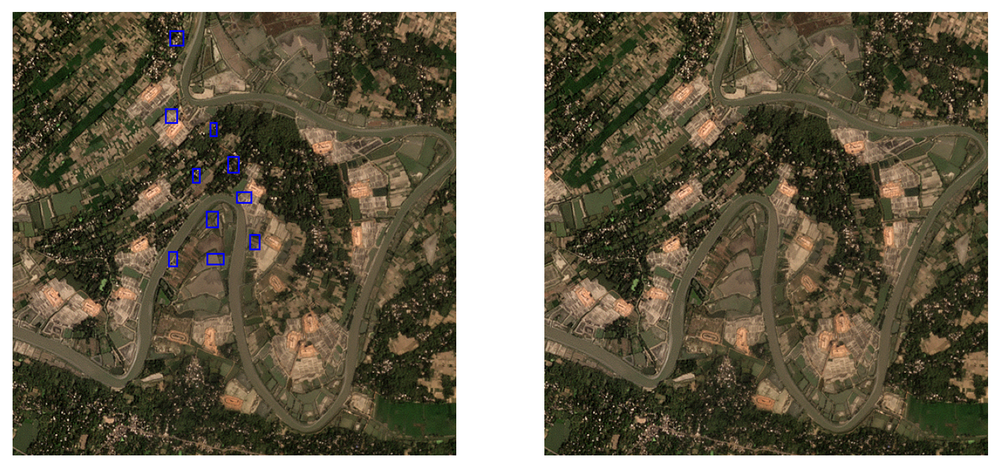

{'bboxes': [[0.3199999928474426, 0.3199999928474426, 639.6799926757812, 639.6799926757812]], 'labels': ['building']}
[[2.       0.64729  0.757592 0.648202 0.773019 0.678999 0.771197 0.678087
  0.755771]
 [2.       0.621934 0.758002 0.638311 0.759962 0.642267 0.72691  0.62589
  0.72495 ]
 [1.       0.436933 0.752844 0.455908 0.752599 0.455367 0.710609 0.436391
  0.710854]
 [1.       0.390266 0.746697 0.395838 0.725686 0.358513 0.715788 0.352941
  0.736798]
 [2.       0.191313 0.681771 0.19888  0.665516 0.16604  0.650229 0.158473
  0.666485]
 [1.       0.597608 0.631375 0.613128 0.621814 0.593354 0.589715 0.577833
  0.599277]
 [2.       0.267107 0.526943 0.27682  0.543234 0.312047 0.522232 0.302334
  0.505941]
 [2.       0.597443 0.533795 0.606569 0.517603 0.574413 0.49948  0.565288
  0.515672]
 [2.       0.294318 0.407282 0.305357 0.424343 0.341266 0.401109 0.330228
  0.384049]
 [2.       0.760589 0.392852 0.763119 0.413029 0.805987 0.407654 0.803458
  0.387478]]
Ground truth [[2.      

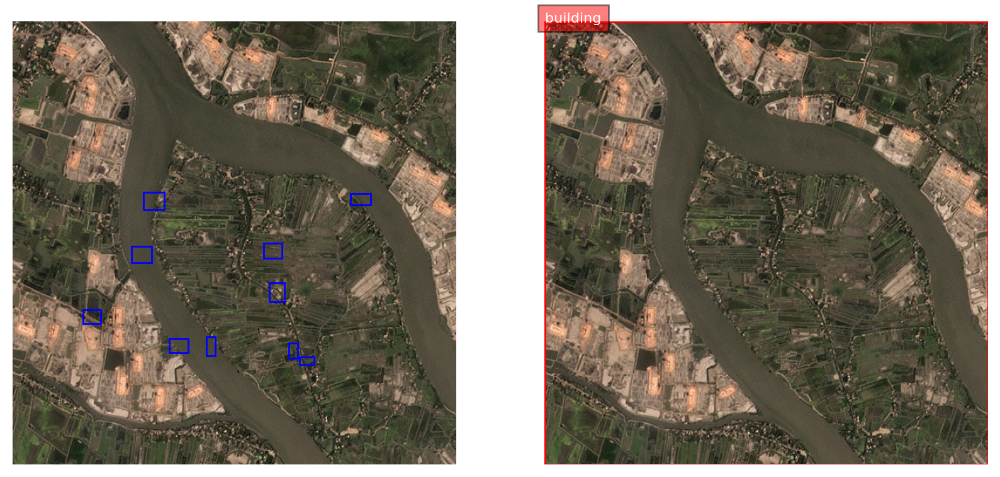

{'bboxes': [[567.3599853515625, 0.3199999928474426, 639.6799926757812, 104.0]], 'labels': ['building']}
[[1.       0.574044 0.599507 0.575937 0.616311 0.610576 0.61241  0.608686
  0.595606]
 [2.       0.729629 0.570076 0.729942 0.554735 0.699352 0.554111 0.69904
  0.569452]
 [2.       0.995208 0.263507 0.995274 0.244524 0.958477 0.244396 0.958411
  0.263379]
 [2.       0.029866 0.923148 0.03655  0.934783 0.060222 0.921185 0.053539
  0.90955 ]
 [2.       0.075567 0.876686 0.083917 0.889348 0.108339 0.873245 0.099989
  0.860582]
 [2.       0.111308 0.856739 0.120712 0.869624 0.143715 0.852836 0.134311
  0.839951]
 [2.       0.175978 0.841199 0.18852  0.835515 0.177507 0.811214 0.164964
  0.816899]
 [2.       0.191865 0.797484 0.198739 0.812143 0.227151 0.798821 0.220278
  0.784162]
 [2.       0.240067 0.757512 0.24926  0.767816 0.269196 0.750029 0.260003
  0.739725]
 [2.       0.281213 0.722805 0.288348 0.736295 0.313591 0.722944 0.306457
  0.709454]
 [2.       0.422137 0.658195 0.423882

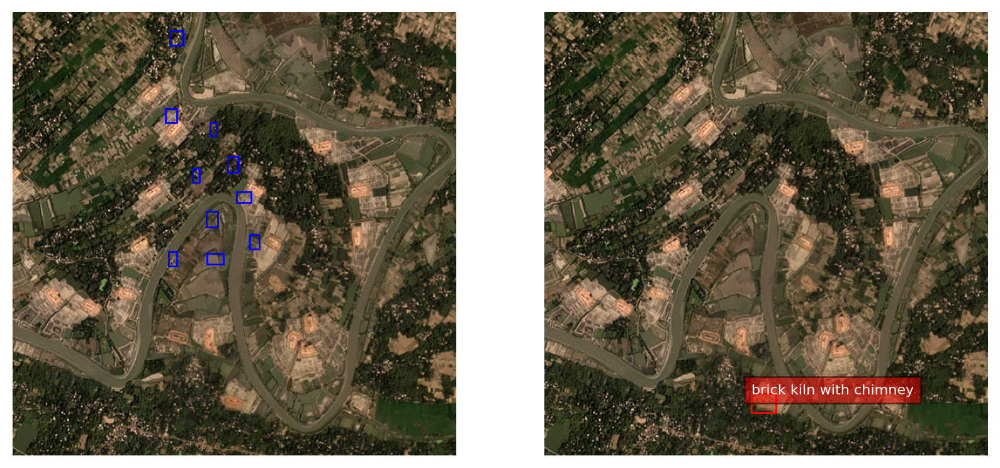

{'bboxes': [[72.0, 141.1199951171875, 172.47999572753906, 238.39999389648438]], 'bboxes_labels': ['brick kiln with chimney'], 'polygons': [], 'polygons_labels': []}
[[2.       0.64729  0.757592 0.648202 0.773019 0.678999 0.771197 0.678087
  0.755771]
 [2.       0.621934 0.758002 0.638311 0.759962 0.642267 0.72691  0.62589
  0.72495 ]
 [1.       0.436933 0.752844 0.455908 0.752599 0.455367 0.710609 0.436391
  0.710854]
 [1.       0.390266 0.746697 0.395838 0.725686 0.358513 0.715788 0.352941
  0.736798]
 [2.       0.191313 0.681771 0.19888  0.665516 0.16604  0.650229 0.158473
  0.666485]
 [1.       0.597608 0.631375 0.613128 0.621814 0.593354 0.589715 0.577833
  0.599277]
 [2.       0.267107 0.526943 0.27682  0.543234 0.312047 0.522232 0.302334
  0.505941]
 [2.       0.597443 0.533795 0.606569 0.517603 0.574413 0.49948  0.565288
  0.515672]
 [2.       0.294318 0.407282 0.305357 0.424343 0.341266 0.401109 0.330228
  0.384049]
 [2.       0.760589 0.392852 0.763119 0.413029 0.805987 0.4076

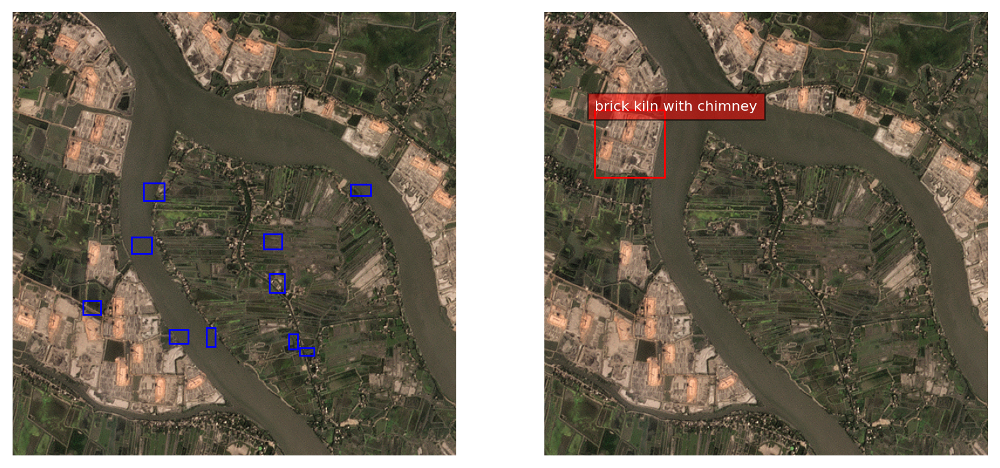

{'bboxes': [[567.3599853515625, 0.3199999928474426, 639.6799926757812, 104.0]], 'bboxes_labels': ['brick kiln with chimney'], 'polygons': [], 'polygons_labels': []}
[[1.       0.574044 0.599507 0.575937 0.616311 0.610576 0.61241  0.608686
  0.595606]
 [2.       0.729629 0.570076 0.729942 0.554735 0.699352 0.554111 0.69904
  0.569452]
 [2.       0.995208 0.263507 0.995274 0.244524 0.958477 0.244396 0.958411
  0.263379]
 [2.       0.029866 0.923148 0.03655  0.934783 0.060222 0.921185 0.053539
  0.90955 ]
 [2.       0.075567 0.876686 0.083917 0.889348 0.108339 0.873245 0.099989
  0.860582]
 [2.       0.111308 0.856739 0.120712 0.869624 0.143715 0.852836 0.134311
  0.839951]
 [2.       0.175978 0.841199 0.18852  0.835515 0.177507 0.811214 0.164964
  0.816899]
 [2.       0.191865 0.797484 0.198739 0.812143 0.227151 0.798821 0.220278
  0.784162]
 [2.       0.240067 0.757512 0.24926  0.767816 0.269196 0.750029 0.260003
  0.739725]
 [2.       0.281213 0.722805 0.288348 0.736295 0.313591 0.7229

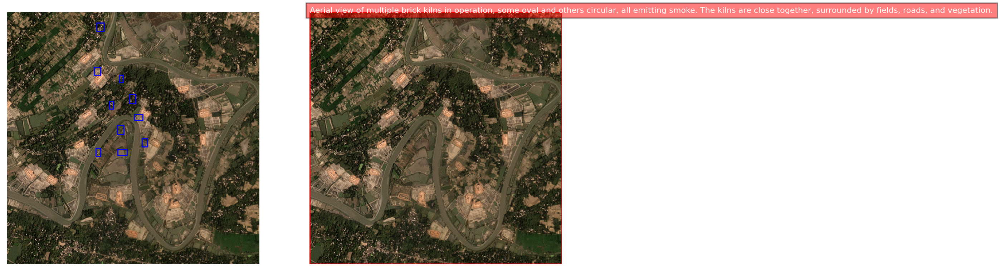

{'bboxes': [[0.3199999928474426, 0.3199999928474426, 639.6799926757812, 639.0399780273438]], 'bboxes_labels': ['Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation.'], 'polygons': [], 'polygons_labels': []}
[[2.       0.64729  0.757592 0.648202 0.773019 0.678999 0.771197 0.678087
  0.755771]
 [2.       0.621934 0.758002 0.638311 0.759962 0.642267 0.72691  0.62589
  0.72495 ]
 [1.       0.436933 0.752844 0.455908 0.752599 0.455367 0.710609 0.436391
  0.710854]
 [1.       0.390266 0.746697 0.395838 0.725686 0.358513 0.715788 0.352941
  0.736798]
 [2.       0.191313 0.681771 0.19888  0.665516 0.16604  0.650229 0.158473
  0.666485]
 [1.       0.597608 0.631375 0.613128 0.621814 0.593354 0.589715 0.577833
  0.599277]
 [2.       0.267107 0.526943 0.27682  0.543234 0.312047 0.522232 0.302334
  0.505941]
 [2.       0.597443 0.533795 0.606569 0.517603 0.574413 0.49948  0.56

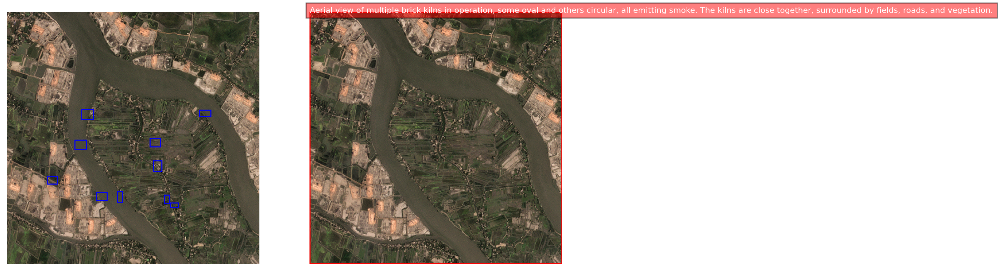

{'bboxes': [[0.3199999928474426, 0.3199999928474426, 639.6799926757812, 639.6799926757812]], 'bboxes_labels': ['Aerial view of multiple brick kilns in operation, some oval and others circular, all emitting smoke. The kilns are close together, surrounded by fields, roads, and vegetation.'], 'polygons': [], 'polygons_labels': []}
[[1.       0.574044 0.599507 0.575937 0.616311 0.610576 0.61241  0.608686
  0.595606]
 [2.       0.729629 0.570076 0.729942 0.554735 0.699352 0.554111 0.69904
  0.569452]
 [2.       0.995208 0.263507 0.995274 0.244524 0.958477 0.244396 0.958411
  0.263379]
 [2.       0.029866 0.923148 0.03655  0.934783 0.060222 0.921185 0.053539
  0.90955 ]
 [2.       0.075567 0.876686 0.083917 0.889348 0.108339 0.873245 0.099989
  0.860582]
 [2.       0.111308 0.856739 0.120712 0.869624 0.143715 0.852836 0.134311
  0.839951]
 [2.       0.175978 0.841199 0.18852  0.835515 0.177507 0.811214 0.164964
  0.816899]
 [2.       0.191865 0.797484 0.198739 0.812143 0.227151 0.798821 0.22

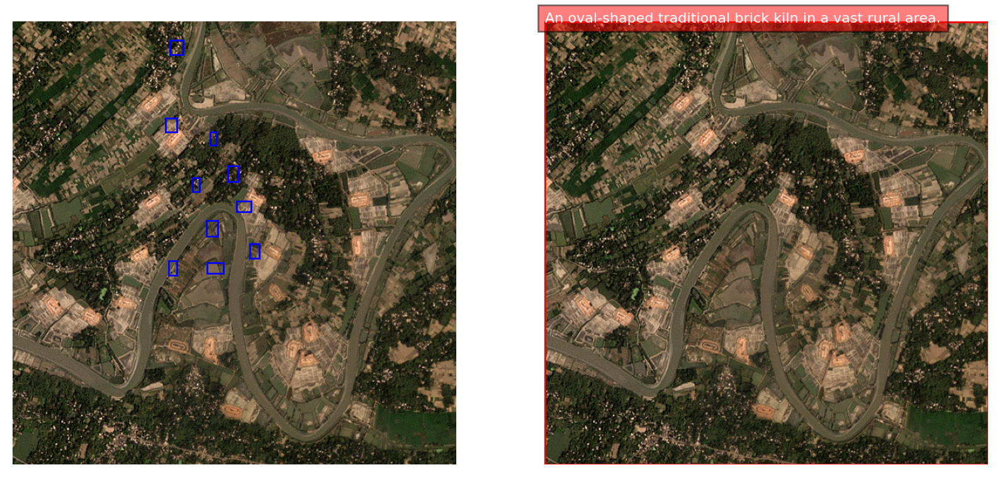

{'bboxes': [[72.0, 141.1199951171875, 172.47999572753906, 239.0399932861328]], 'bboxes_labels': ['An oval-shaped traditional brick kiln in a vast rural area.'], 'polygons': [], 'polygons_labels': []}
[[2.       0.64729  0.757592 0.648202 0.773019 0.678999 0.771197 0.678087
  0.755771]
 [2.       0.621934 0.758002 0.638311 0.759962 0.642267 0.72691  0.62589
  0.72495 ]
 [1.       0.436933 0.752844 0.455908 0.752599 0.455367 0.710609 0.436391
  0.710854]
 [1.       0.390266 0.746697 0.395838 0.725686 0.358513 0.715788 0.352941
  0.736798]
 [2.       0.191313 0.681771 0.19888  0.665516 0.16604  0.650229 0.158473
  0.666485]
 [1.       0.597608 0.631375 0.613128 0.621814 0.593354 0.589715 0.577833
  0.599277]
 [2.       0.267107 0.526943 0.27682  0.543234 0.312047 0.522232 0.302334
  0.505941]
 [2.       0.597443 0.533795 0.606569 0.517603 0.574413 0.49948  0.565288
  0.515672]
 [2.       0.294318 0.407282 0.305357 0.424343 0.341266 0.401109 0.330228
  0.384049]
 [2.       0.760589 0.39285

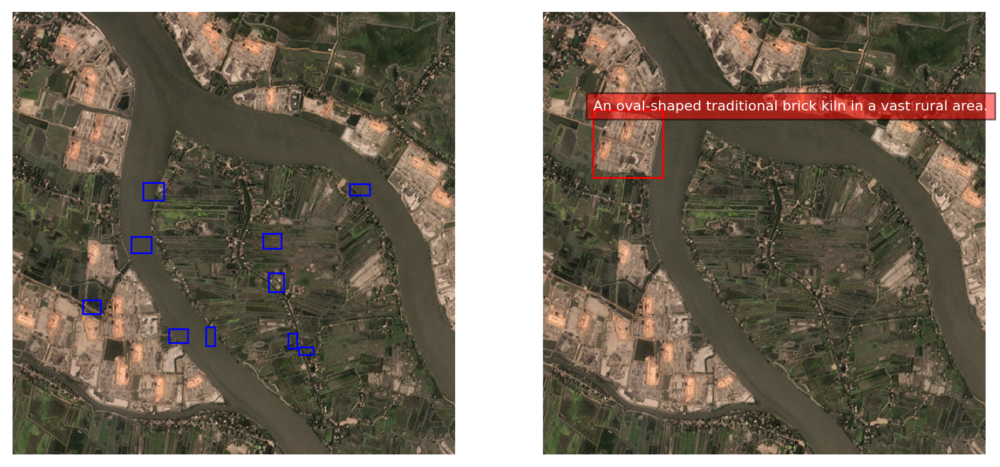

{'bboxes': [[0.3199999928474426, 0.3199999928474426, 639.6799926757812, 639.6799926757812]], 'bboxes_labels': ['An oval-shaped traditional brick kiln in a vast rural area.'], 'polygons': [], 'polygons_labels': []}
[[1.       0.574044 0.599507 0.575937 0.616311 0.610576 0.61241  0.608686
  0.595606]
 [2.       0.729629 0.570076 0.729942 0.554735 0.699352 0.554111 0.69904
  0.569452]
 [2.       0.995208 0.263507 0.995274 0.244524 0.958477 0.244396 0.958411
  0.263379]
 [2.       0.029866 0.923148 0.03655  0.934783 0.060222 0.921185 0.053539
  0.90955 ]
 [2.       0.075567 0.876686 0.083917 0.889348 0.108339 0.873245 0.099989
  0.860582]
 [2.       0.111308 0.856739 0.120712 0.869624 0.143715 0.852836 0.134311
  0.839951]
 [2.       0.175978 0.841199 0.18852  0.835515 0.177507 0.811214 0.164964
  0.816899]
 [2.       0.191865 0.797484 0.198739 0.812143 0.227151 0.798821 0.220278
  0.784162]
 [2.       0.240067 0.757512 0.24926  0.767816 0.269196 0.750029 0.260003
  0.739725]
 [2.       0.

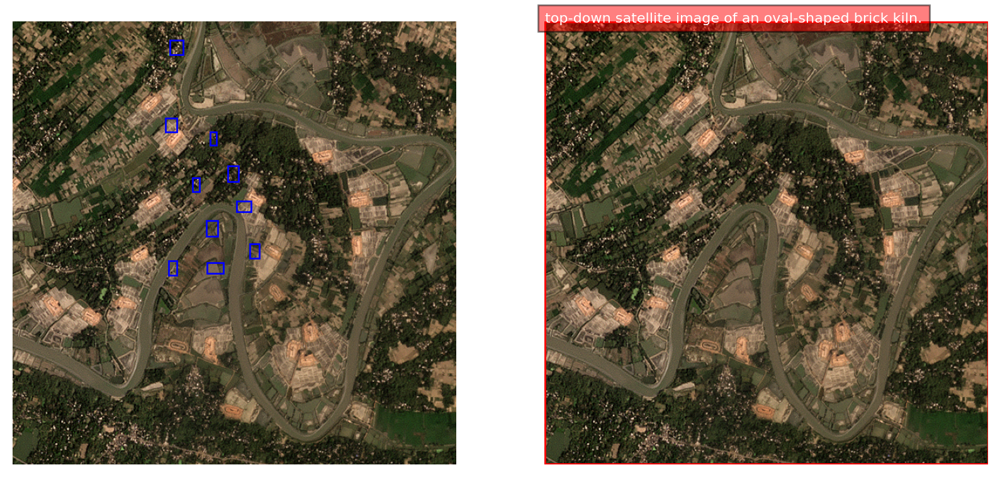

{'bboxes': [[72.0, 141.1199951171875, 172.47999572753906, 239.0399932861328]], 'bboxes_labels': ['top-down satellite image of an oval-shaped brick kiln.'], 'polygons': [], 'polygons_labels': []}
[[2.       0.64729  0.757592 0.648202 0.773019 0.678999 0.771197 0.678087
  0.755771]
 [2.       0.621934 0.758002 0.638311 0.759962 0.642267 0.72691  0.62589
  0.72495 ]
 [1.       0.436933 0.752844 0.455908 0.752599 0.455367 0.710609 0.436391
  0.710854]
 [1.       0.390266 0.746697 0.395838 0.725686 0.358513 0.715788 0.352941
  0.736798]
 [2.       0.191313 0.681771 0.19888  0.665516 0.16604  0.650229 0.158473
  0.666485]
 [1.       0.597608 0.631375 0.613128 0.621814 0.593354 0.589715 0.577833
  0.599277]
 [2.       0.267107 0.526943 0.27682  0.543234 0.312047 0.522232 0.302334
  0.505941]
 [2.       0.597443 0.533795 0.606569 0.517603 0.574413 0.49948  0.565288
  0.515672]
 [2.       0.294318 0.407282 0.305357 0.424343 0.341266 0.401109 0.330228
  0.384049]
 [2.       0.760589 0.392852 0.7

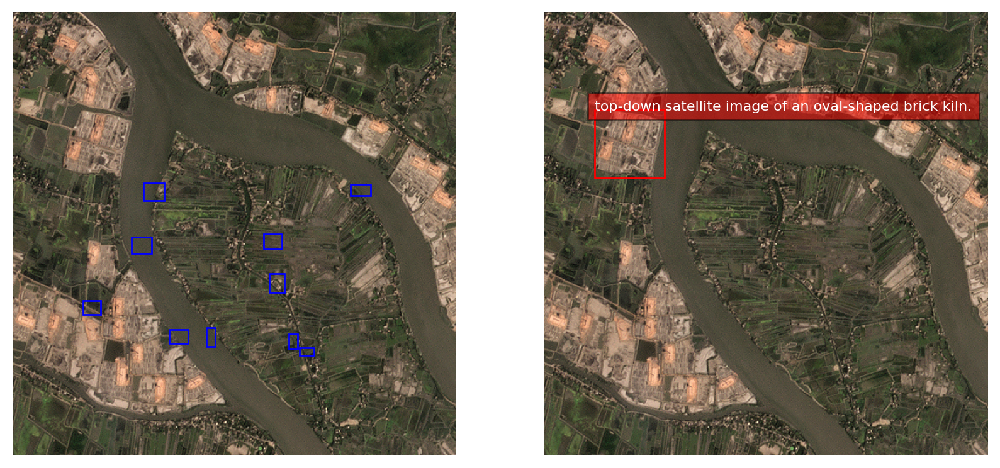

{'bboxes': [[567.3599853515625, 0.3199999928474426, 639.6799926757812, 104.0]], 'bboxes_labels': ['top-down satellite image of an oval-shaped brick kiln.'], 'polygons': [], 'polygons_labels': []}
[[1.       0.574044 0.599507 0.575937 0.616311 0.610576 0.61241  0.608686
  0.595606]
 [2.       0.729629 0.570076 0.729942 0.554735 0.699352 0.554111 0.69904
  0.569452]
 [2.       0.995208 0.263507 0.995274 0.244524 0.958477 0.244396 0.958411
  0.263379]
 [2.       0.029866 0.923148 0.03655  0.934783 0.060222 0.921185 0.053539
  0.90955 ]
 [2.       0.075567 0.876686 0.083917 0.889348 0.108339 0.873245 0.099989
  0.860582]
 [2.       0.111308 0.856739 0.120712 0.869624 0.143715 0.852836 0.134311
  0.839951]
 [2.       0.175978 0.841199 0.18852  0.835515 0.177507 0.811214 0.164964
  0.816899]
 [2.       0.191865 0.797484 0.198739 0.812143 0.227151 0.798821 0.220278
  0.784162]
 [2.       0.240067 0.757512 0.24926  0.767816 0.269196 0.750029 0.260003
  0.739725]
 [2.       0.281213 0.722805 0.

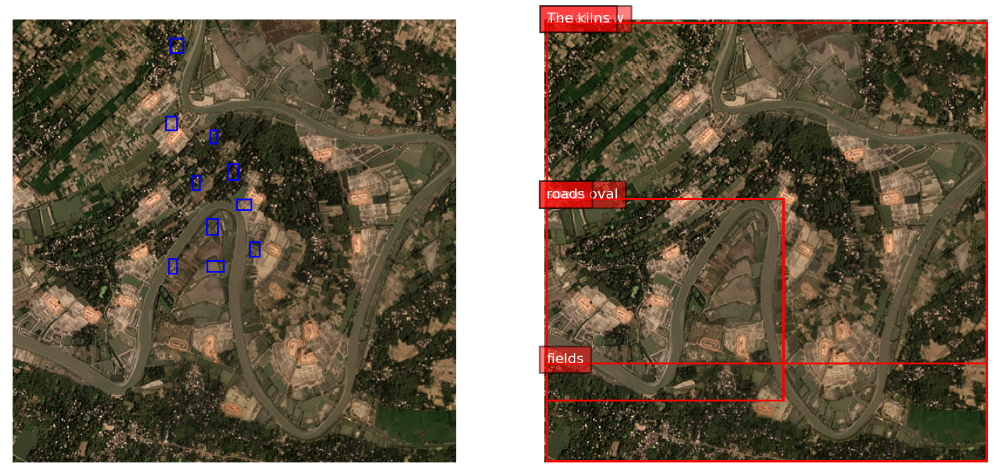

{'bboxes': [[3.5199999809265137, 2.879999876022339, 637.760009765625, 637.760009765625], [200.0, 169.27999877929688, 637.760009765625, 637.760009765625], [2.240000009536743, 2.879999876022339, 309.44000244140625, 585.2799682617188]], 'labels': ['Aerial view', 'The kilns', 'The kilns']}
[[2.       0.64729  0.757592 0.648202 0.773019 0.678999 0.771197 0.678087
  0.755771]
 [2.       0.621934 0.758002 0.638311 0.759962 0.642267 0.72691  0.62589
  0.72495 ]
 [1.       0.436933 0.752844 0.455908 0.752599 0.455367 0.710609 0.436391
  0.710854]
 [1.       0.390266 0.746697 0.395838 0.725686 0.358513 0.715788 0.352941
  0.736798]
 [2.       0.191313 0.681771 0.19888  0.665516 0.16604  0.650229 0.158473
  0.666485]
 [1.       0.597608 0.631375 0.613128 0.621814 0.593354 0.589715 0.577833
  0.599277]
 [2.       0.267107 0.526943 0.27682  0.543234 0.312047 0.522232 0.302334
  0.505941]
 [2.       0.597443 0.533795 0.606569 0.517603 0.574413 0.49948  0.565288
  0.515672]
 [2.       0.294318 0.4072

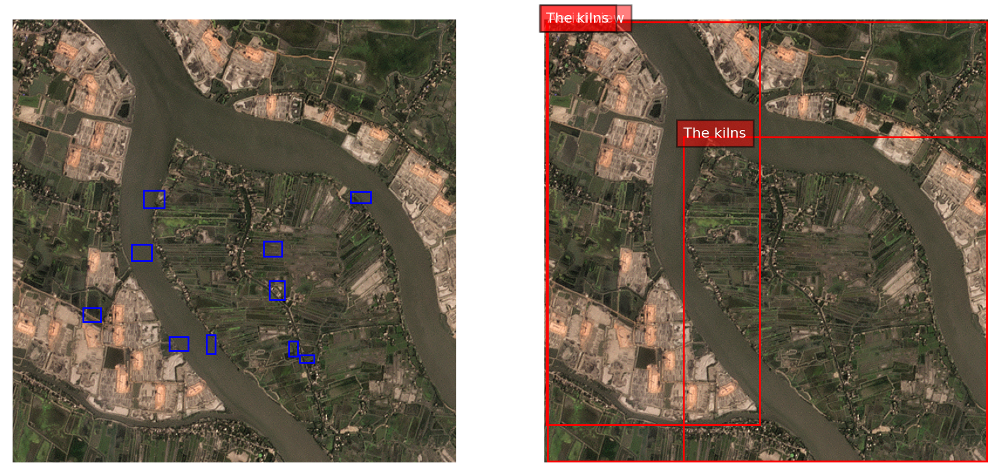

{'bboxes': [[2.879999876022339, 2.879999876022339, 637.760009765625, 637.760009765625], [385.6000061035156, 2.240000009536743, 639.0399780273438, 633.9199829101562], [425.91998291015625, 448.3199768066406, 486.0799865722656, 492.47998046875], [456.6399841308594, 0.9599999785423279, 639.0399780273438, 348.47998046875], [420.1600036621094, 415.67999267578125, 639.0399780273438, 633.9199829101562], [456.6399841308594, 0.9599999785423279, 639.6799926757812, 348.47998046875]], 'labels': ['Aerial view', 'brick kilns', 'some oval', 'smoke', 'The kilns', 'roads']}
[[1.       0.574044 0.599507 0.575937 0.616311 0.610576 0.61241  0.608686
  0.595606]
 [2.       0.729629 0.570076 0.729942 0.554735 0.699352 0.554111 0.69904
  0.569452]
 [2.       0.995208 0.263507 0.995274 0.244524 0.958477 0.244396 0.958411
  0.263379]
 [2.       0.029866 0.923148 0.03655  0.934783 0.060222 0.921185 0.053539
  0.90955 ]
 [2.       0.075567 0.876686 0.083917 0.889348 0.108339 0.873245 0.099989
  0.860582]
 [2.    

KeyboardInterrupt: 

In [28]:
gt_kilns = 0
pred_kilns = [0]*12
corr_preds = [0]*12
iou_th = 0.3
for x in range(12):
    for i in range(15):
        im_path = os.path.join(images_folder, image_names[i])
        lab_path = os.path.join(labels_folder, label_names[i])
        if i==1 or i==2:
            gt_num, pred_num, num_corr = compare_gt_pred(im_path, lab_path, task_prompts[x], text_prompts[x], iou_th, plot_results = True)
        else:
            gt_num, pred_num, num_corr = compare_gt_pred(im_path, lab_path, task_prompts[x], text_prompts[x], iou_th)
        if x==0:
            gt_kilns+=gt_num
        pred_kilns[x]+=pred_num
        corr_preds[x]+=num_corr
    print()
    print("Text prompt:", task_prompts[x] + text_prompts[x])
    print('Actual number of kilns =', gt_kilns)
    print("Predicted number of kilns =", pred_kilns[x])
    print(f"Number of kilns identified correctly with IoU threshold {iou_th} =", corr_preds[x])
    if corr_preds[x]!=0:
        prec = corr_preds[x]/pred_kilns[x]
        print("Precision =", prec)
        rec = corr_preds[x]/gt_kilns
        print("Recall =", rec)
        f1 = 2*prec*rec/(prec+rec)
        print("F1 score =", f1)

In [ ]:
# tetr = "satellite image of brick kilns in a rural area"
# tatr = "<CAPTION_TO_PHRASE_GROUNDING>"
# im_path_tr = images_folder + "/" + "8988385_3137890.tif"
# lab_path_tr = aa_labels_folder + "/" + "8988385_3137890.txt"
# gt_num, pred_num, num_corr = compare_gt_pred(im_path_tr, lab_path_tr, tatr, tetr, 0.1, plot_results = True)
# print()

In [ ]:
image

In [ ]:
# metadata_path = "/home/patel_zeel/kiln_compass_24/data/lucknow_airshed/metadata.geojson"
# image_folder = "/home/patel_zeel/kiln_compass_24/data/"
# task_prompt = "<MORE_DETAILED_CAPTION>"
# image_path = image_folder+"lucknow_airshed/images/9035164_3091111.tif"
# label_path = image_folder+"lucknow_airshed/labels/9035164_3091111.txt"
# with open(metadata_path) as f:
#     metadata = geojson.load(f)
# image_tensor,label_tensor, image_metadata = spec_defs.load_image_and_label(image_path, label_path, metadata)
# image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
# height, width, _ = image_np.shape
# image = Image.fromarray((image_np * 255).astype(np.uint8))  # Convert back to 8-bit per channel

# inputs = processor(text = task_prompt, images=image, return_tensors="pt").to(device, torch_dtype)
# generated_ids = model.generate(
#     input_ids=inputs["input_ids"],
#     pixel_values=inputs["pixel_values"],
#     max_new_tokens=4096,
#     num_beams=3,
#     do_sample=False
# )
# generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
# od_parsed = processor.post_process_generation(generated_text, task=task_prompt, image_size=(image.width, image.height))
# print(od_parsed)

In [ ]:
# xx = """Satellite image of rural area with factories, trees, fields, brick kilns with chimneys and roads"""
# im_path_tr = images_folder + "/" + "8988385_3137890.tif"
# lab_path_tr = aa_labels_folder + "/" + "8988385_3137890.txt"
# gt_num, pred_num, num_corr = compare_gt_pred(im_path_tr, lab_path_tr, tatr, xx, 0.1, plot_results = True)
# print(gt_num, pred_num, num_corr)

In [ ]:
# taps = ["<OPEN_VOCABULARY_DETECTION>", "<CAPTION_TO_PHRASE_GROUNDING>", "<CAPTION_TO_PHRASE_GROUNDING>"]
# teps = ["chimneys and brick kilns", "chimneys and brick kilns", "Satellite image of rural area with factories, trees, fields, brick kilns with chimneys and roads"]

In [ ]:
# gt_kilns = 155
# iou_th = 0.1
# for x in range(3):
#     pred_kilns = 0
#     corr_preds = 0
#     for i in range(15):
#         im_path = images_folder + "/" + image_names[i]
#         lab_path = aa_labels_folder + "/" + label_names[i]
#         if i==0 or i==1:
#             gt_num, pred_num, num_corr = compare_gt_pred(im_path, lab_path, taps[x], teps[x], iou_th, plot_results = True)
#         else:
#             gt_num, pred_num, num_corr = compare_gt_pred(im_path, lab_path, taps[x], teps[x], iou_th)
#         # if x==0:
#         #     gt_kilns+=gt_num
#         pred_kilns+=pred_num
#         corr_preds+=num_corr
#     print()
#     print("Text prompt:", taps[x] + teps[x])
#     print('Actual number of kilns =', gt_kilns)
#     print("Predicted number of kilns =", pred_kilns)
#     print(f"Number of kilns identified correctly with IoU threshold {iou_th} =", corr_preds)
#     if corr_preds!=0:
#         prec = corr_preds/pred_kilns
#         print("Precision =", prec)
#         rec = corr_preds/gt_kilns
#         print("Recall =", rec)
#         f1 = 2*prec*rec/(prec+rec)
#         print("F1 score =", f1)
#     print()

In [ ]:
# taps = ["<OPEN_VOCABULARY_DETECTION>", "<OPEN_VOCABULARY_DETECTION>", "<CAPTION_TO_PHRASE_GROUNDING>", "<CAPTION_TO_PHRASE_GROUNDING>", "<CAPTION_TO_PHRASE_GROUNDING>", "<CAPTION_TO_PHRASE_GROUNDING>"]
# teps = ["brick kilns", "brick kiln with chimney", "brick kilns", "brick kiln with chimney", "fields, factories, roads and brick kilns", "Satellite image of rural area with factories, trees, fields, brick kilns with chimneys and roads"]

In [ ]:
# gt_kilns = 155
# iou_th = 0.3
# for x in range(6):
#     pred_kilns = 0
#     corr_preds = 0
#     for i in range(15):
#         im_path = images_folder + "/" + image_names[i]
#         lab_path = aa_labels_folder + "/" + label_names[i]
#         if i==10:
#             gt_num, pred_num, num_corr = compare_gt_pred(im_path, lab_path, taps[x], teps[x], iou_th, plot_results = True)
#         else:
#             gt_num, pred_num, num_corr = compare_gt_pred(im_path, lab_path, taps[x], teps[x], iou_th)
#         # if x==0:
#         #     gt_kilns+=gt_num
#         pred_kilns+=pred_num
#         corr_preds+=num_corr
#     print()
#     print("Text prompt:", taps[x] + teps[x])
#     print('Actual number of kilns =', gt_kilns)
#     print("Predicted number of kilns =", pred_kilns)
#     print(f"Number of kilns identified correctly with IoU threshold {iou_th} =", corr_preds)
#     if corr_preds!=0:
#         prec = corr_preds/pred_kilns
#         print("Precision =", prec)
#         rec = corr_preds/gt_kilns
#         print("Recall =", rec)
#         f1 = 2*prec*rec/(prec+rec)
#         print("F1 score =", f1)
#     print()